# Smart Traffic Demo

**Author: Wulan Mantiri**

Last modified: Sept 2021

Tried models:
- yolov3
- yolov4 (used)
- yolov4-csp

References: 
- https://github.com/arunponnusamy/cvlib/
- https://github.com/AlexeyAB/darknet

## Model YOLOv4

### Installation

In [1]:
!pip install progressbar -q
!pip install imutils -q

You should consider upgrading via the '/home/ec2-user/anaconda3/envs/pytorch_latest_p37/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/home/ec2-user/anaconda3/envs/pytorch_latest_p37/bin/python -m pip install --upgrade pip' command.


In [2]:
import requests
import progressbar as pb
import imageio
from imutils import paths

import os
import cv2
import numpy as np

import matplotlib.pyplot as plt
import pandas as pd

Matplotlib is building the font cache; this may take a moment.


### Configuration

In [3]:
DEST_DIR = os.path.expanduser('~') + os.path.sep + 'smart-traffic' + os.path.sep + 'model'

COLORS = np.random.uniform(0, 255, size=(80, 3))

CFG_FILE_NAME = 'yolov4.cfg'
CFG_URL = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4.cfg'

WEIGHTS_FILE_NAME = 'yolov4.weights'
WEIGHTS_URL = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v3_optimal/yolov4.weights'

CLASS_FILE_NAME = 'coco_classes.txt'
CLASS_URL = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/data/coco.names'

### Utils

In [4]:
def download_file(url, file_name, dest_dir):
    """A method to download file from public url
    Args:
        url: download url
        file_name: given name of to-be-downloaded file
        dest_dir: download destination directory
    """

    if not os.path.exists(dest_dir):
        os.makedirs(dest_dir)

    full_path_to_file = dest_dir + os.path.sep + file_name
    if os.path.exists(dest_dir + os.path.sep + file_name):
        return full_path_to_file

    print("Downloading " + file_name + " from " + url)

    try:
        r = requests.get(url, allow_redirects=True, stream=True)
    except:
        print("Could not establish connection. Download failed")
        return None

    file_size = int(r.headers['Content-Length'])
    chunk_size = 1024
    num_bars = round(file_size / chunk_size)

    bar = pb.ProgressBar(maxval=num_bars).start()

    if r.status_code != requests.codes.ok:
        print("Error occurred while downloading file")
        return None

    count = 0    
    with open(full_path_to_file, 'wb') as file:
        for chunk in  r.iter_content(chunk_size=chunk_size):
            file.write(chunk)
            bar.update(count)
            count +=1

    return full_path_to_file

### Class Label Population

In [5]:
def populate_class_labels():
    """A method to obtain class labels for model based on CLASS_* configuration"""

    class_file_abs_path = DEST_DIR + os.path.sep + CLASS_FILE_NAME
    if not os.path.exists(class_file_abs_path):
        download_file(url=CLASS_URL, file_name=CLASS_FILE_NAME, dest_dir=DEST_DIR)
    f = open(class_file_abs_path, 'r')
    classes = [line.strip() for line in f.readlines()]
    return classes

# Pre-populate class labels
classes = populate_class_labels()

### Object Detection

In [13]:
def get_output_layers(net):
    layer_names = net.getLayerNames()
    output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]
    return output_layers



def draw_bbox(img, bbox, labels, confidence, colors=None, write_conf=True):
    """A method to apply a box to the image
    Args:
        img: An image in the form of a numPy array
        bbox: An array of bounding boxes
        labels: An array of labels
        colors: An array of colours the length of the number of targets(80)
        write_conf: An option to write the confidences to the image
    """
    for i, label in enumerate(labels):
        if colors is None:
            color = COLORS[classes.index(label)]            
        else:
            color = colors[classes.index(label)]

        if write_conf:
            label += ' ' + str(format(confidence[i] * 100, '.2f')) + '%'

        cv2.rectangle(img, (bbox[i][0],bbox[i][1]), (bbox[i][2],bbox[i][3]), color, 2)
        cv2.putText(img, label, (bbox[i][0],bbox[i][1]-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    return img



def detect_common_objects(image, confidence=0.1, nms_thresh=0.5, size=1280, enable_gpu=False):
    """A method to detect common objects (with most suitable default params)
    Args:
        image: A colour image in a numpy array
        confidence: A value to filter out objects recognised to a lower confidence score
        nms_thresh: An NMS value
        size: A blob size (width, height)
        enable_gpu: A boolean to set whether the GPU will be used
    """

    height, width = image.shape[:2]
    scale = 0.00392

    config_file_abs_path = DEST_DIR + os.path.sep + CFG_FILE_NAME
    if not os.path.exists(config_file_abs_path):
        download_file(url=CFG_URL, file_name=CFG_FILE_NAME, dest_dir=DEST_DIR)

    weights_file_abs_path = DEST_DIR + os.path.sep + WEIGHTS_FILE_NAME    
    if not os.path.exists(weights_file_abs_path):
        download_file(url=WEIGHTS_URL, file_name=WEIGHTS_FILE_NAME, dest_dir=DEST_DIR)    

    net = cv2.dnn.readNet(weights_file_abs_path, config_file_abs_path)
    blob = cv2.dnn.blobFromImage(image, scale, (size,size), (0,0,0), True, crop=False)

    # enables opencv dnn module to use CUDA on Nvidia card instead of CPU
    if enable_gpu:
        net.setPreferableBackend(cv2.dnn.DNN_BACKEND_CUDA)
        net.setPreferableTarget(cv2.dnn.DNN_TARGET_CUDA)

    net.setInput(blob)
    outs = net.forward(get_output_layers(net))

    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            max_conf = scores[class_id]
            if max_conf > confidence:
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)
                x = center_x - (w / 2)
                y = center_y - (h / 2)
                class_ids.append(class_id)
                confidences.append(float(max_conf))
                boxes.append([x, y, w, h])

    indices = cv2.dnn.NMSBoxes(boxes, confidences, confidence, nms_thresh)

    bbox = []
    label = []
    conf = []
    for i in indices:
        i = i[0]
        box = boxes[i]
        x = box[0]
        y = box[1]
        w = box[2]
        h = box[3]
        bbox.append([int(x), int(y), int(x+w), int(y+h)])
        label.append(str(classes[class_ids[i]]))
        conf.append(confidences[i])

    return bbox, label, conf



def count_vehicles(labels):
    res = {
        'car': 0,
        'truck': 0,
        'motorbike': 0,
        'bus': 0,
    }
    for name in labels:
        try:
            res[name] += 1
        except KeyError:
            pass
    res['total'] = sum(res.values())
    return res

### Example

In [14]:
file_name = "traffic.png"

image = cv2.imread(file_name)
box, labels, count = detect_common_objects(image)
output = draw_bbox(image, box, labels, count)

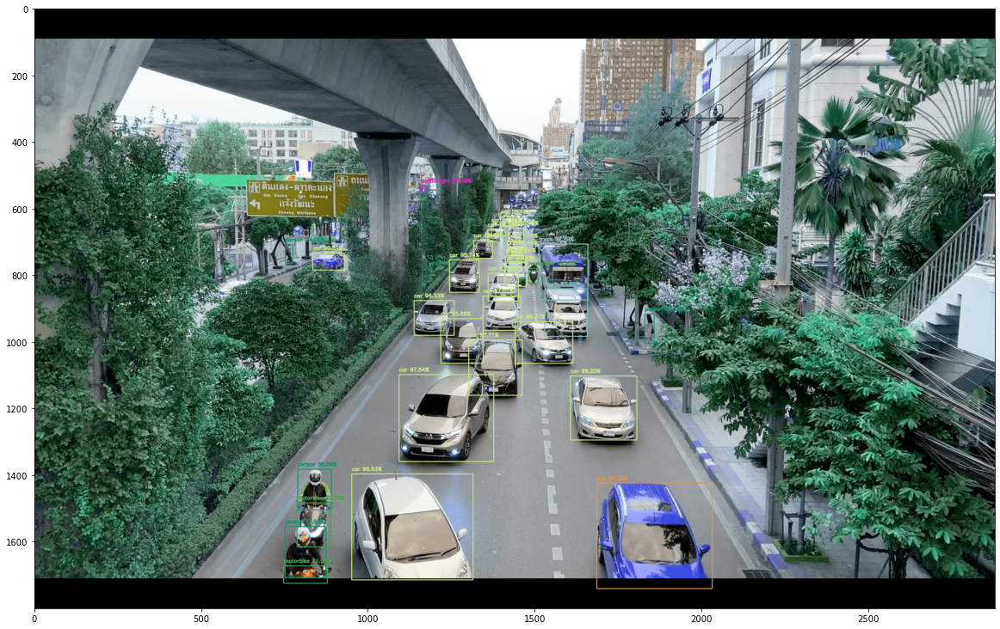

Vehicles: {'car': 20, 'truck': 2, 'motorbike': 3, 'bus': 1, 'total': 26}


In [15]:
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()
print('Vehicles:', count_vehicles(labels))

In [9]:
# Save image with bbox
cv2.imwrite("traffic_yolov4.png", output)

True

## Amazon Rekognition

In [18]:
import boto3
rekognition_client = boto3.client('rekognition')


def detect_objects_with_rekog(file_name):
    with open(file_name, 'rb') as image:
        response = rekognition_client.detect_labels(
            Image={'Bytes': image.read()},
            MinConfidence=0,
        )
    return response


def count_vehicles_rekog(response):
    res = {
        'Car': 0,
        'Motorcycle': 0,
        'Bus': 0,
    }
    for label in response['Labels']:
        try:
            name = label['Name']
            res[name] += len(label['Instances'])
        except KeyError:
            pass
    res['total'] = sum(res.values())
    return res

### Example

In [19]:
file_name = "traffic.png"
response = detect_objects_with_rekog(file_name)

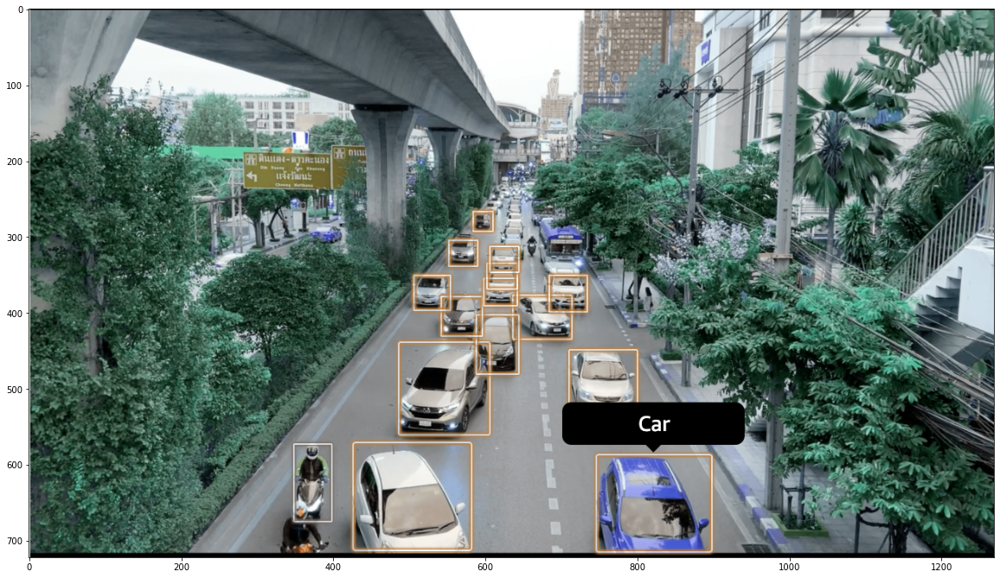

Vehicles: {'Car': 14, 'Motorcycle': 0, 'Bus': 0, 'total': 14}


In [20]:
rekog_res = cv2.imread("traffic_rekog_res.png")
plt.figure(figsize=(20,15))
plt.imshow(rekog_res)
plt.show()
print('Vehicles:', count_vehicles_rekog(response))

## Comparison (Amazon Rekognition vs YOLOv4)

1. Close-up high quality picture (2MB): > 58% better

In [21]:
file_name = "traffic3_cropped.png"

# Yolov4 model
image = cv2.imread(file_name)
box, labels, count = detect_common_objects(image)
output = draw_bbox(image, box, labels, count)

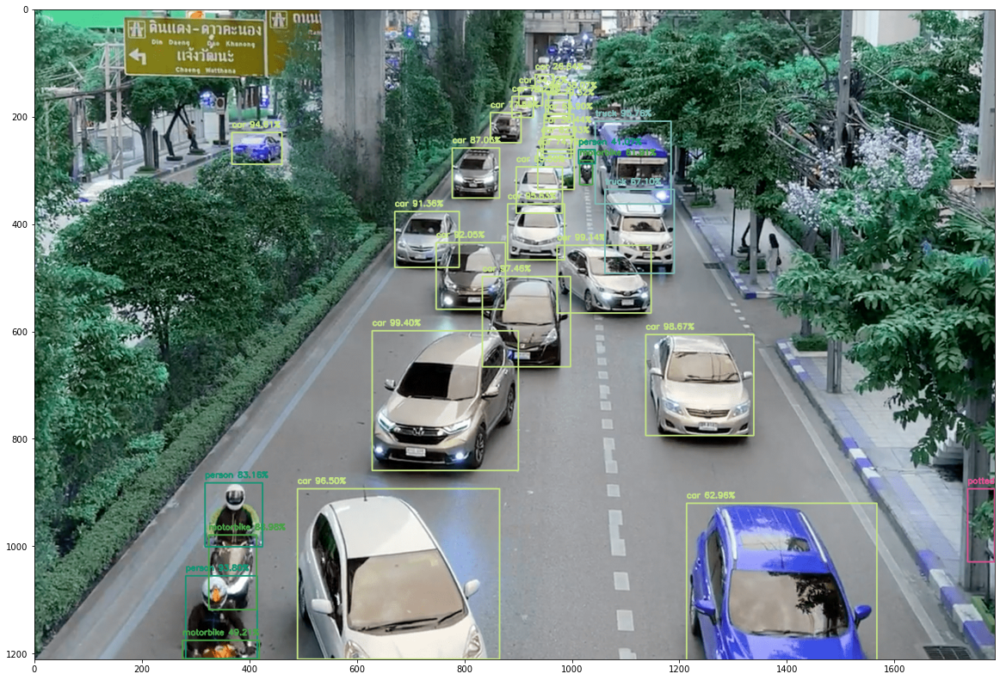

Vehicles: {'car': 22, 'truck': 2, 'motorbike': 3, 'bus': 0, 'total': 27}


In [22]:
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()
print('Vehicles:', count_vehicles(labels))

In [23]:
# Amazon Rekognition
file_name = "traffic3_cropped.png"
response = detect_objects_with_rekog(file_name)

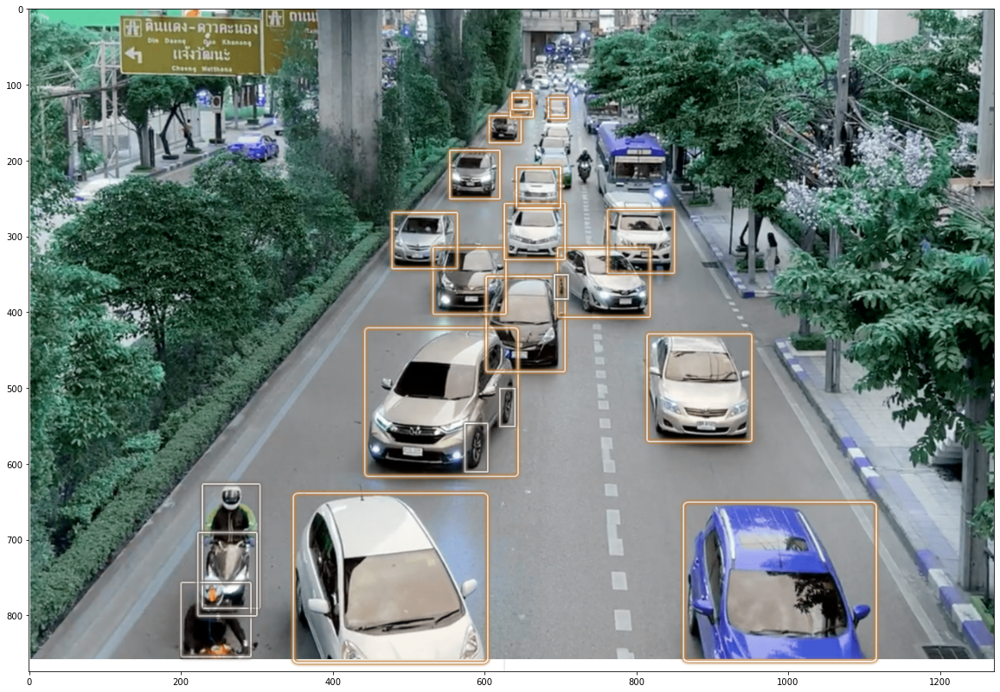

Vehicles: {'Car': 16, 'Motorcycle': 1, 'Bus': 0, 'total': 17}


In [24]:
rekog_res = cv2.imread("traffic3_rekog_res.png")
plt.figure(figsize=(20,15))
plt.imshow(rekog_res)
plt.show()
print('Vehicles:', count_vehicles_rekog(response))

2. Low quality picture (40 kB)

In [30]:
file_name = "tolp.ru_0001_cropped.jpg"

# Yolov4 model
image = cv2.imread(file_name)
box, labels, count = detect_common_objects(image)
output = draw_bbox(image, box, labels, count)

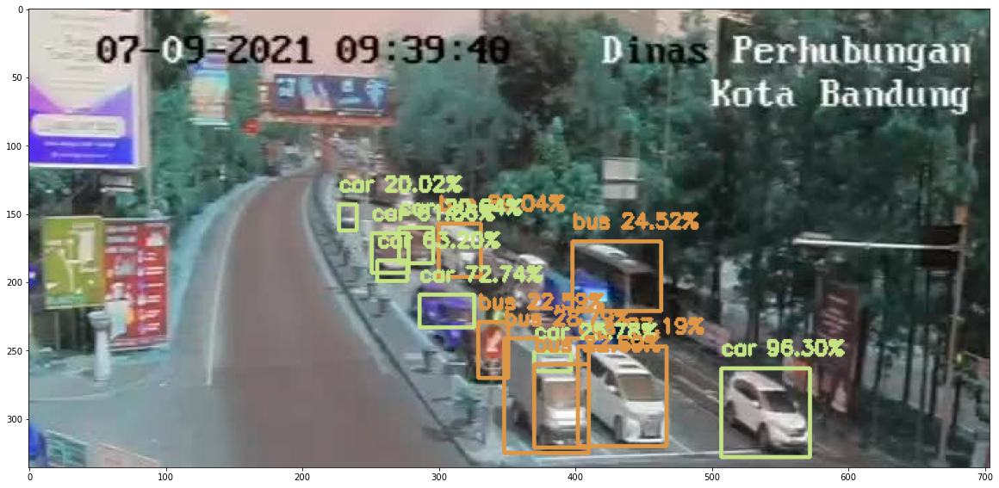

Vehicles: {'car': 7, 'truck': 0, 'motorbike': 0, 'bus': 6, 'total': 13}


In [31]:
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()
print('Vehicles:', count_vehicles(labels))

In [32]:
# Save image with bbox
cv2.imwrite("tolp_cropped_bbox.png", output)

True

In [33]:
# Amazon Rekognition
response = detect_objects_with_rekog(file_name)

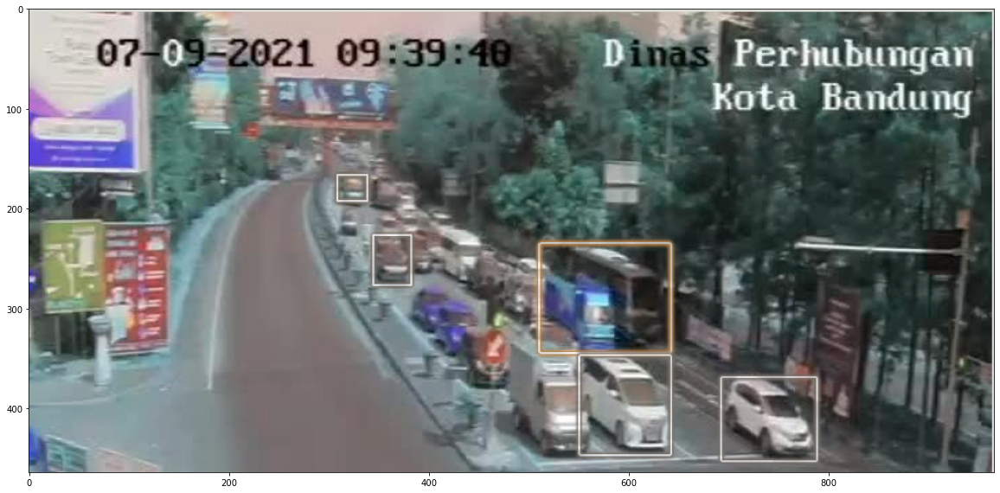

Vehicles: {'Car': 4, 'Motorcycle': 0, 'Bus': 1, 'total': 5}


In [34]:
rekog_res = cv2.imread("tolp_cropped_rekog_res.png")
plt.figure(figsize=(20,15))
plt.imshow(rekog_res)
plt.show()
print('Vehicles:', count_vehicles_rekog(response))

3. Dark low quality picture (97 kB)

In [44]:
file_name = "high_quality_dark_crop.png"

# Yolov4 model
image = cv2.imread(file_name)
box, labels, count = detect_common_objects(image)
output = draw_bbox(image, box, labels, count)

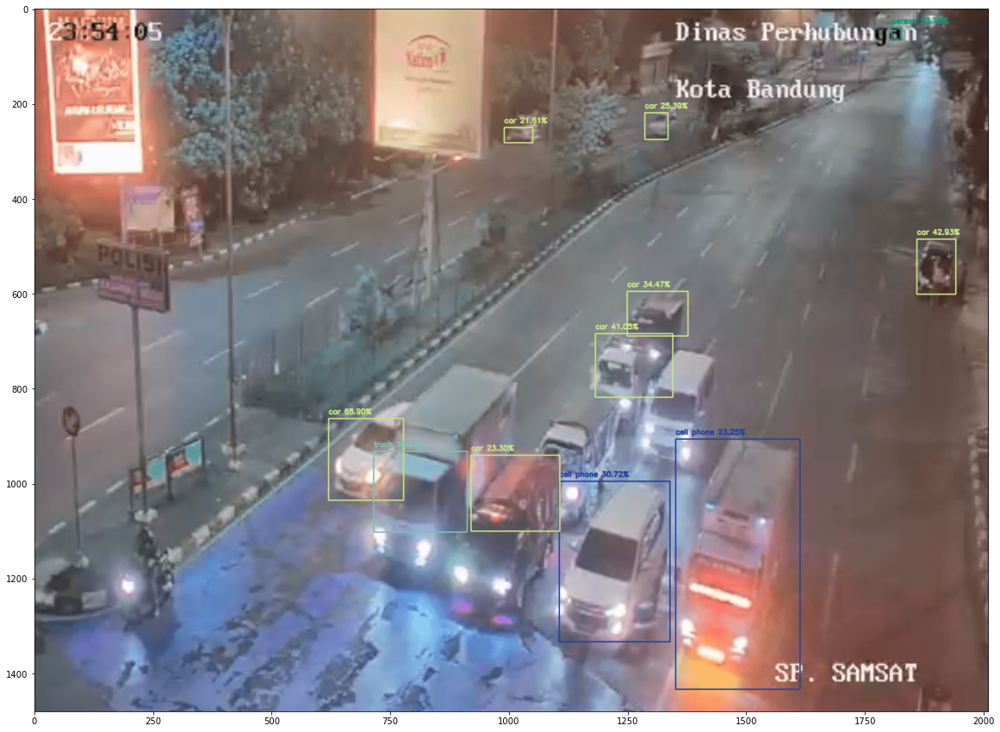

Vehicles: {'car': 7, 'truck': 1, 'motorbike': 0, 'bus': 0, 'total': 8}


In [45]:
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()
print('Vehicles:', count_vehicles(labels))

In [ ]:
Research

In [ ]:
def detect_objects_w_model(image, confidence=0.5, nms_thresh=0.3, model='yolov4', enable_gpu=False):
    """A method to detect common objects
    Args:
        image: A colour image in a numpy array
        confidence: A value to filter out objects recognised to a lower confidence score
        nms_thresh: An NMS value
        model: The detection model to be used, supported models are: yolov3, yolov3-tiny, yolov4, yolov4-tiny
        enable_gpu: A boolean to set whether the GPU will be used
    """

    Height, Width = image.shape[:2]
    scale = 0.00392

    if model == 'yolov4-p6':
        config_file_name = 'yolov4-p6.cfg'
        cfg_url = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4-p6.cfg'
        weights_file_name = 'yolov4-p6.weights'
        weights_url = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v4_pre/yolov4-p6.weights'
        blob = cv2.dnn.blobFromImage(image, scale, (1280,1280), (0,0,0), True, crop=False)

    elif model == 'yolov4-p5':
        config_file_name = 'yolov4-p5.cfg'
        cfg_url = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4-p5.cfg'
        weights_file_name = 'yolov4-p5.weights'
        weights_url = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v4_pre/yolov4-p5.weights'
        blob = cv2.dnn.blobFromImage(image, scale, (896,896), (0,0,0), True, crop=False)

    elif model == 'yolov4-csp-x-swish':
        config_file_name = 'yolov4-csp-x-swish.cfg'
        cfg_url = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4-csp-x-swish.cfg'
        weights_file_name = 'yolov4-csp-x-swish.weights'
        weights_url = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v4_pre/yolov4-csp-x-swish.weights'
        blob = cv2.dnn.blobFromImage(image, scale, (640,640), (0,0,0), True, crop=False)

    elif model == 'yolov4-csp-swish':
        config_file_name = 'yolov4-csp-swish.cfg'
        cfg_url = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4-csp-swish.cfg'
        weights_file_name = 'yolov4-csp-swish.weights'
        weights_url = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v4_pre/yolov4-csp-swish.weights'
        blob = cv2.dnn.blobFromImage(image, scale, (640,640), (0,0,0), True, crop=False)

    elif model == 'yolov4x-mish':
        config_file_name = 'yolov4x-mish.cfg'
        cfg_url = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4x-mish.cfg'
        weights_file_name = 'yolov4x-mish.weights'
        weights_url = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v4_pre/yolov4x-mish.weights'
        blob = cv2.dnn.blobFromImage(image, scale, (640,640), (0,0,0), True, crop=False)

    elif model == 'yolov3-tiny':
        config_file_name = 'yolov3-tiny.cfg'
        cfg_url = "https://github.com/pjreddie/darknet/raw/master/cfg/yolov3-tiny.cfg"
        weights_file_name = 'yolov3-tiny.weights'
        weights_url = 'https://pjreddie.com/media/files/yolov3-tiny.weights'
        blob = cv2.dnn.blobFromImage(image, scale, (416,416), (0,0,0), True, crop=False)

    elif model == 'yolov4':
        config_file_name = 'yolov4.cfg'
        cfg_url = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4.cfg'
        weights_file_name = 'yolov4.weights'
        weights_url = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v3_optimal/yolov4.weights'
        blob = cv2.dnn.blobFromImage(image, scale, (416,416), (0,0,0), True, crop=False)

    elif model == 'yolov4-tiny':
        config_file_name = 'yolov4-tiny.cfg'
        cfg_url = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4-tiny.cfg'
        weights_file_name = 'yolov4-tiny.weights'
        weights_url = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v4_pre/yolov4-tiny.weights'
        blob = cv2.dnn.blobFromImage(image, scale, (416,416), (0,0,0), True, crop=False)      

    else:
        config_file_name = 'yolov3.cfg'
        cfg_url = 'https://github.com/arunponnusamy/object-detection-opencv/raw/master/yolov3.cfg'
        weights_file_name = 'yolov3.weights'
        weights_url = 'https://pjreddie.com/media/files/yolov3.weights'

    config_file_abs_path = dest_dir + os.path.sep + config_file_name
    weights_file_abs_path = dest_dir + os.path.sep + weights_file_name    
    
    if not os.path.exists(config_file_abs_path):
        download_file(url=cfg_url, file_name=config_file_name, dest_dir=dest_dir)

    if not os.path.exists(weights_file_abs_path):
        download_file(url=weights_url, file_name=weights_file_name, dest_dir=dest_dir)    

    classes = populate_class_labels()
    net = cv2.dnn.readNet(weights_file_abs_path, config_file_abs_path)

    # enables opencv dnn module to use CUDA on Nvidia card instead of cpu
    if enable_gpu:
        net.setPreferableBackend(cv2.dnn.DNN_BACKEND_CUDA)
        net.setPreferableTarget(cv2.dnn.DNN_TARGET_CUDA)

    net.setInput(blob)

    outs = net.forward(get_output_layers(net))

    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            max_conf = scores[class_id]
            if max_conf > confidence:
                center_x = int(detection[0] * Width)
                center_y = int(detection[1] * Height)
                w = int(detection[2] * Width)
                h = int(detection[3] * Height)
                x = center_x - (w / 2)
                y = center_y - (h / 2)
                class_ids.append(class_id)
                confidences.append(float(max_conf))
                boxes.append([x, y, w, h])


    indices = cv2.dnn.NMSBoxes(boxes, confidences, confidence, nms_thresh)

    bbox = []
    label = []
    conf = []

    for i in indices:
        i = i[0]
        box = boxes[i]
        x = box[0]
        y = box[1]
        w = box[2]
        h = box[3]
        bbox.append([int(x), int(y), int(x+w), int(y+h)])
        label.append(str(classes[class_ids[i]]))
        conf.append(confidences[i])
        
    return bbox, label, conf
